<a href="https://colab.research.google.com/github/JungWoo-Chae/GANs-in-action/blob/master/chapter-9/9_CycleGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Chapter 9: CycleGAN**

## Download Dataset

In [ ]:
%%bash

FILE=apple2orange
rm -rf ./datasets
mkdir ./datasets

URL=https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/$FILE.zip
ZIP_FILE=./datasets/$FILE.zip
TARGET_DIR=./datasets/$FILE/
wget -N $URL -O $ZIP_FILE
mkdir $TARGET_DIR
unzip $ZIP_FILE -d ./datasets/
rm $ZIP_FILE

mkdir -p ./images/$FILE/

## Imports

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets.folder import default_loader

import itertools

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

## Dataset

In [ ]:
class apple2orangeDataset(Dataset):

    def __init__(self, root, train=True, transform=None):
        if train:
            path_A = os.path.join(root,'trainA/')
            path_B = os.path.join(root,'trainB/')
        else:
            path_A = os.path.join(root,'testA/')
            path_B = os.path.join(root,'testB/')
        self.transform = transform
        self.dataset_A = glob.glob(path_A+'*.jpg')
        self.dataset_B = glob.glob(path_B+'*.jpg')
        self.datanumb = min(len(self.dataset_A),len(self.dataset_B))
        


    def __len__(self):
        return self.datanumb

    def __getitem__(self, idx):
        img_A = default_loader(self.dataset_A[idx])
        img_B = default_loader(self.dataset_B[idx])

        if self.transform:
            img_A = self.transform(img_A)
            img_B = self.transform(img_B)

        return img_A, img_B

In [ ]:
transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((128, 128)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Lambda(lambda x: 2*x-1)
    ])

In [ ]:
trainset = apple2orangeDataset(root='./datasets/apple2orange',train=True, transform=transform)

testset = apple2orangeDataset(root='./datasets/apple2orange',train=False, transform=transform)

test_loader = torch.utils.data.DataLoader(testset, batch_size=1,
                                         shuffle=True, num_workers=4)

## Hyperparameter

In [ ]:
dataset_name = 'apple2orange'

patch = int(img_rows / 2**4)
disc_patch = (1, patch, patch)

lambda_cycle = 10.0                   
lambda_id = 0.9 * lambda_cycle

gf = 32
df = 64

In [ ]:
class conv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=4, normalization=True):
        super(conv2d, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=2, padding=1)
        self.acti = nn.LeakyReLU()
        self.normalization =  normalization
        if self.normalization:
            self.ino = nn.InstanceNorm2d(out_channels)
    def forward(self, x):
        x = self.conv(x)
        x = self.acti(x)
        if self.normalization:
            x= self.ino(x)
        return x

In [ ]:
class deconv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=4, 
                 dropout_rate=0):
        super(deconv2d, self).__init__()
        self.up = nn.Upsample(scale_factor=2, mode='nearest')
        self.conv =  nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=1, padding=3, dilation=2)
        self.acti = nn.ReLU()
        self.dropout_rate = dropout_rate
        if dropout_rate:
                self.do = nn.Dropout(p=dropout_rate)
        self.ino= nn.InstanceNorm2d(out_channels)

    def forward(self, x, y):
        x = self.up(x)
        x = self.conv(x)
        x = self.acti(x)
        if self.dropout_rate:
            x= self.do(x)
        x= self.ino(x)
        x = torch.cat((x, y), 1)     
        return x

## Generator

In [ ]:
class Generator(nn.Module):
    def __init__(self, gf):
        super(Generator, self).__init__()
        
        self.d1 = conv2d(3, gf)
        self.d2 = conv2d(gf, gf * 2)
        self.d3 = conv2d(gf * 2, gf * 4)
        self.d4 = conv2d(gf * 4, gf * 8)

        self.u1 = deconv2d(gf * 8, gf * 4)
        self.u2 = deconv2d(gf * 8, gf * 2)
        self.u3 = deconv2d(gf * 4, gf)
        self.u4 =  nn.Upsample(scale_factor=2, mode='nearest')
        self.conv = nn.Conv2d(gf * 2, 3, kernel_size=4, stride=1, padding=3, dilation=2)
        
    def forward(self, x):
        x1 = self.d1(x)
        x2 = self.d2(x1)
        x3 = self.d3(x2)
        x4 = self.d4(x3)

        x = self.u1(x4, x3)
        x = self.u2(x,x2)
        x = self.u3(x,x1)
        x = self.u4(x)
        x = torch.tanh(self.conv(x))

        return x

## Discriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, gf):
        super(Discriminator, self).__init__()
        
        self.d1 = conv2d(3, df)
        self.d2 = conv2d(df, df * 2)
        self.d3 = conv2d(df * 2, df * 4)
        self.d4 = conv2d(df * 4, df * 8)
        self.conv = nn.Conv2d(df * 8, 1, kernel_size=4, stride=1, padding=3, dilation=2)
      

    def forward(self, x):
        d1 = self.d1(x)
        d2 = self.d2(d1)
        d3 = self.d3(d2)
        d4 = self.d4(d3)
        validity = self.conv(d4)
        return validity

In [ ]:
d_A = Discriminator(df)
d_A = d_A.to(device)
d_B = Discriminator(df)
d_B = d_B.to(device)
g_AB = Generator(gf)
g_AB = g_AB.to(device)
g_BA = Generator(gf)
g_BA = g_BA.to(device)

## Sampling function

In [ ]:
def sample_images(g_AB, g_BA, epoch, batch_i):
    r, c = 2, 3
    dataiter = iter(test_loader)
    imgs_A, imgs_B = dataiter.next()

    imgs_A = imgs_A.to(device)
    imgs_B = imgs_B.to(device)
    
    fake_B = g_AB(imgs_A)
    fake_A = g_BA(imgs_B)
    reconstr_A = g_BA(fake_B)
    reconstr_B = g_AB(fake_A)

    gen_imgs = torch.cat([imgs_A, fake_B, reconstr_A, imgs_B, fake_A, reconstr_B])
    gen_imgs = gen_imgs.cpu().detach().numpy()

    gen_imgs = 0.5 * gen_imgs + 0.5

    titles = ['Original', 'Translated', 'Reconstructed']
    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt].transpose(1, 2, 0))
            axs[i, j].set_title(titles[j])
            axs[i,j].axis('off')
            cnt += 1
    plt.show()

## Training loop

In [ ]:
losses = []
iteration_checkpoints = []

def train(epochs, batch_size, sample_interval):

    train_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                           shuffle=True, num_workers=4, pin_memory=True)
   
    valid = torch.ones( batch_size, *disc_patch, device=device, dtype=torch.float)
    fake = torch.zeros( batch_size, *disc_patch, device=device, dtype=torch.float)

    criterion = nn.MSELoss()
    criterion_mae = nn.L1Loss()

    d_A_optimizer = torch.optim.Adam(d_A.parameters(), lr=0.0002, betas=(0.5, 0.999))
    d_B_optimizer = torch.optim.Adam(d_B.parameters(), lr=0.0002, betas=(0.5, 0.999))
    g_optimizer = torch.optim.Adam(itertools.chain(g_AB.parameters(), g_BA.parameters()), lr=0.0002, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for batch_i, (imgs_A, imgs_B) in enumerate(train_loader):
            if len(imgs_A) != batch_size:
                break

            imgs_A = imgs_A.to(device)
            imgs_B = imgs_B.to(device)

            d_A.train()
            d_B.train()
            g_AB.eval()
            g_BA.eval()

            fake_B = g_AB(imgs_A)
            fake_A = g_BA(imgs_B)

            outputs_A_real = d_A(imgs_A)
            outputs_A_fake = d_A(fake_A)
            d_A_loss_real = criterion(outputs_A_real, valid)
            d_A_loss_fake = criterion(outputs_A_fake, fake)
            d_A_loss = 0.5* (d_A_loss_real + d_A_loss_fake)


            d_A_optimizer.zero_grad()
            d_A_loss.backward(retain_graph=True)
            d_A_optimizer.step()

            outputs_B_real = d_B(imgs_B)
            outputs_B_fake = d_B(fake_B)
            d_B_loss_real = criterion(outputs_B_real, valid)
            d_B_loss_fake = criterion(outputs_B_fake, fake)
            d_B_loss = 0.5* (d_B_loss_real + d_B_loss_fake)

            
            d_B_optimizer.zero_grad()
            d_B_loss.backward(retain_graph=True)
            d_B_optimizer.step()

            d_loss = 0.5* (d_A_loss + d_B_loss)

            d_A.eval()
            d_B.eval()
            g_AB.train()
            g_BA.train()

            fake_B = g_AB(imgs_A)
            fake_A = g_BA(imgs_B)
            reconstr_A = g_BA(fake_B)
            reconstr_B = g_AB(fake_A)
            img_A_id = g_BA(imgs_A)
            img_B_id = g_AB(imgs_B)
            valid_A = d_A(fake_A)
            valid_B = d_B(fake_B)


            g_AB_loss = criterion(valid_B, valid)+lambda_cycle*criterion_mae(reconstr_B,imgs_B)+lambda_id*criterion_mae(img_B_id,imgs_B)
            g_BA_loss = criterion(valid_A, valid)+lambda_cycle*criterion_mae(reconstr_A,imgs_A)+lambda_id*criterion_mae(img_A_id,imgs_A)

            g_loss = 0.5* (g_AB_loss + g_BA_loss)


            g_optimizer.zero_grad()
            g_loss.backward()
            g_optimizer.step()


            if (batch_i + 1) % sample_interval == 0:
                g_AB.eval()
                g_BA.eval()
                iteration_checkpoints.append(batch_i + 1)

                sample_images(g_AB, g_BA, epoch, batch_i)      


## Train the CycleGAN

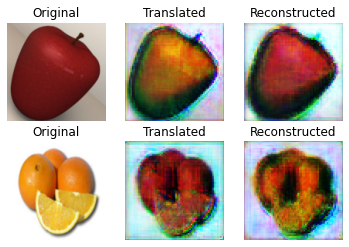

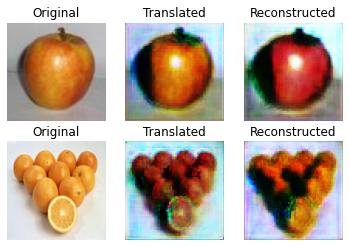

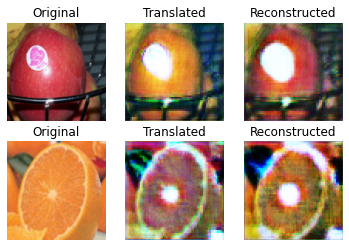

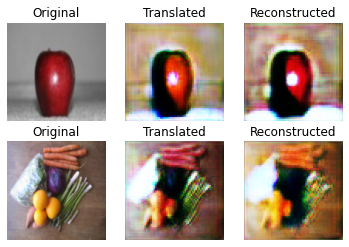

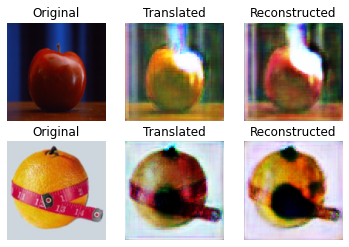

...

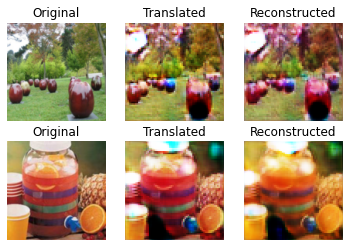

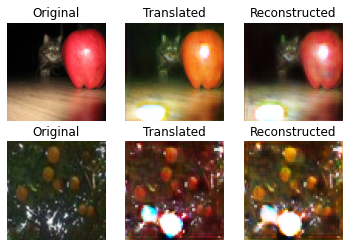

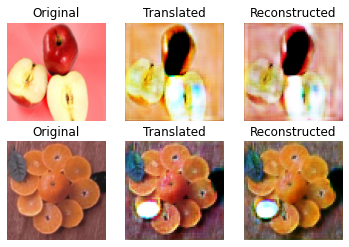

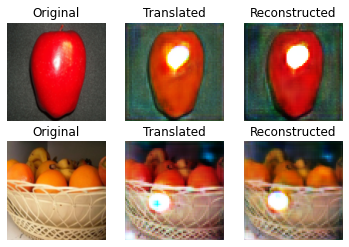

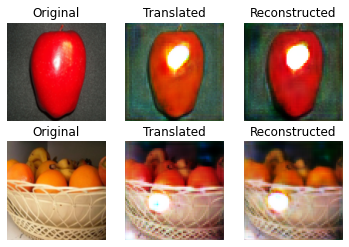

In [ ]:
epochs=100
batch_size=64
sample_interval = 10

train(epochs, batch_size, sample_interval)